In [1]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns

import itertools

from statsmodels.tsa.stattools import grangercausalitytests
from scipy.signal import correlate
import dcor
import statsmodels.api as sm
from statsmodels.tsa.api import VAR
from tslearn.metrics import dtw

from sklearn.preprocessing import MinMaxScaler
from sklearn.feature_selection import mutual_info_regression

In [2]:
# We begin by loading the 4 datasets, one for each year from 2020 to 2023

data2020 = pd.read_csv('DTK_2020.CSV').rename(columns={    'Προϊόν': 'product', 
    'Κωδικός': 'code', 
    'W%-Μήνας-Ετήσιο': 'month',
    'ΔΤΚ': 'CPI',
}).drop(columns=['code','Unnamed: 4']).reset_index(drop=True)

data2021 = pd.read_csv('DTK_2021.CSV').rename(columns={    'Προϊόν': 'product', 
    'Κωδικός': 'code', 
    'W%-Μήνας-Ετήσιο': 'month',
    'ΔΤΚ': 'CPI',
}).drop(columns=['code','Unnamed: 4']).reset_index(drop=True)

data2022 = pd.read_csv('DTK_2022.CSV').rename(columns={    'Προϊόν': 'product', 
    'Κωδικός': 'code', 
    'W%-Μήνας-Ετήσιο': 'month',
    'ΔΤΚ': 'CPI',
}).drop(columns=['code','Unnamed: 4']).reset_index(drop=True)

data2023 = pd.read_csv('DTK_2023.CSV').rename(columns={    'Προϊόν': 'product', 
    'Κωδικός': 'code', 
    'W%-Μήνας-Ετήσιο': 'month',
    'ΔΤΚ': 'CPI',
}).drop(columns=['code','Unnamed: 4']).reset_index(drop=True)


In [3]:
# W%0 is the initial value of the referred product in euros. Every subsequent value is the percentage increase  of that value. 
# While it could be for quantitative analysis and comparison to minimum and average wage in Greece, we will ignore it for now
# and focus on the percentage changes of prices throught the years.
data2020 = data2020[data2020['month'] != 'W%0'].reset_index(drop=True)
data2021 = data2021[data2021['month'] != 'W%0'].reset_index(drop=True)
data2022 = data2022[data2022['month'] != 'W%0'].reset_index(drop=True)
data2023 = data2023[data2023['month'] != 'W%0'].reset_index(drop=True)

data2020.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4786 entries, 0 to 4785
Data columns (total 3 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   product  4786 non-null   object 
 1   month    4786 non-null   object 
 2   CPI      4784 non-null   float64
dtypes: float64(1), object(2)
memory usage: 112.3+ KB


In [4]:
# Always check for null values.
data2020[data2020['CPI'].isna()], data2021[data2021['CPI'].isna()], data2022[data2022['CPI'].isna()], data2023[data2023['CPI'].isna()]

(                 product       month  CPI
 4420  ΑΣΦΑΛΙΣΗ ΚΑΤΟΙΚΙΑΣ  Δεκέμβριος  NaN
 4421  ΑΣΦΑΛΙΣΗ ΚΑΤΟΙΚΙΑΣ     ΕΤΗΣΙΟΣ  NaN,
                  product       month  CPI
 4421  ΑΣΦΑΛΙΣΗ ΚΑΤΟΙΚΙΑΣ  Δεκέμβριος  NaN
 4422  ΑΣΦΑΛΙΣΗ ΚΑΤΟΙΚΙΑΣ     ΕΤΗΣΙΟΣ  NaN,
                  product       month  CPI
 4420  ΑΣΦΑΛΙΣΗ ΚΑΤΟΙΚΙΑΣ  Δεκέμβριος  NaN
 4421  ΑΣΦΑΛΙΣΗ ΚΑΤΟΙΚΙΑΣ     ΕΤΗΣΙΟΣ  NaN,
                  product       month  CPI
 4420  ΑΣΦΑΛΙΣΗ ΚΑΤΟΙΚΙΑΣ  Δεκέμβριος  NaN
 4421  ΑΣΦΑΛΙΣΗ ΚΑΤΟΙΚΙΑΣ     ΕΤΗΣΙΟΣ  NaN)

In [5]:
# Null values represent home insurance records. We will not work with them as home insurance is not considered as important of a product
data2020 = data2020[~data2020['CPI'].isna()]
data2021 = data2021[~data2021['CPI'].isna()]
data2022 = data2022[~data2022['CPI'].isna()]
data2023 = data2023[~data2023['CPI'].isna()]

In [6]:
data2020[data2020['CPI'].isna()], data2021[data2021['CPI'].isna()], data2022[data2022['CPI'].isna()], data2023[data2023['CPI'].isna()]

(Empty DataFrame
 Columns: [product, month, CPI]
 Index: [],
 Empty DataFrame
 Columns: [product, month, CPI]
 Index: [],
 Empty DataFrame
 Columns: [product, month, CPI]
 Index: [],
 Empty DataFrame
 Columns: [product, month, CPI]
 Index: [])

We need to change everything to English. First we will change the month names and then the selected products.

In [7]:
month_order = [
    "Ιανουάριος", "Φεβρουάριος", "Μάρτιος", "Απρίλιος", "Μάιος", "Ιούνιος",
    "Ιούλιος", "Αύγουστος", "Σεπτέμβριος", "Οκτώβριος", "Νοέμβριος", "Δεκέμβριος", 'ΕΤΗΣΙΟΣ'
]

# Corresponding English month names
english_months = [
    "January", "February", "March", "April", "May", "June",
    "July", "August", "September", "October", "November", "December", 'Yearly'
]

# Create a dictionary for renaming 
month_rename_dict = dict(zip(month_order, english_months))


data2020['month'] = data2020['month'].map(month_rename_dict)
data2021['month'] = data2021['month'].map(month_rename_dict)
data2022['month'] = data2022['month'].map(month_rename_dict)
data2023['month'] = data2023['month'].map(month_rename_dict)

We have 358 unique products in each dataframe. We will pick 45 of which are crucial in judging the economic status of a country and 
map them to change them from Greek to English.

In [8]:
len(data2020['product'].unique())
# data2020['product'].unique()

358

In [9]:
rename_dict  = {
    "PYZI": "Flour and other cereals",
    "ΖΥΜΑΡΙΚΑ": "Pasta",
    "ΨΩΜΙ ΚΑΙ ΔΗΜΗΤΡΙΑΚΑ": "Bread and cereals",
    "ΜΟΣΧΑΡΙ": "Beef",
    "XOIPINO": "Pork",
    "ΠΟΥΛΕΡΙΚΑ": "Poultry",
    "ΛΟΙΠΑ ΕΙΔΗ ΚΡΕΑΤΟΣ": "Other types of meat",
    "ΨAPIA NΩΠA": "Fresh fish",
    "ΨAPIA KATEΨΥΓΜΕΝΑ": "Frozen fish",
    "ΘΑΛΑΣΣΙΝΑ ΚΑΤΕΨΥΓΜΕΝΑ": "Frozen seafood",
    "ΓΑΛΑ ΝΩΠΟ ΠΛΗΡΕΣ": "Fresh whole milk",
    "ΓIAOYPTI": "Yogurt",
    "TYPIA": "Cheese",
    "ΕΛΑΙΟΛΑΔΟ": "Olive oil",
    "ΦΡΟΥΤΑ ΝΩΠΑ": "Fresh fruits",
    "ΛAXANIKA ΝΩΠΑ": "Fresh vegetables",
    "ΠΑΤΑΤΕΣ": "Potatoes",
    "ZAXAPH": "Sugar",
    "ΠΑΙΔΙΚΕΣ ΤΡΟΦΕΣ": "Baby food",
    "ΚΑΦΕΣ": "Coffee",
    "ΥΔΡΕΥΣΗ": "Water supply",
    "ΔΗΜΟΤΙΚΑ ΤΕΛΗ": "Municipal fees",
    "ΑΠΟΧΕΤΕΥΣΗ": "Sewerage",
    "ΥΠΗΡΕΣΙΕΣ ΚΟΙΝΟΧΡΗΣΤΩΝ": "Common services",
    "ΗΛΕΚΤΡΙΣΜΟΣ": "Electricity",
    "ΦΥΣΙΚΟ ΑΕΡΙΟ": "Natural gas",
    "ΥΓPAEPIO": "Water supply",
    "ΠΕΤΡΕΛΑΙΟ ΘΕΡΜΑΝΣΗΣ": "Heating oil",
    "ΣΤΕΡΕΑ ΚΑΥΣΙΜΑ": "Solid fuels",
    "ΦΥΣΙΚΟ ΑΕΡΙΟ ΚΑΙ ΑΛΛΑ ΚΑΥΣΙΜΑ": "Natural gas and other fuels",
    "ΣΤΕΓΑΣΗ": "Housing",
    "ΕΠΙΠΛΑ": "Furniture",
    "ΣΥΣΚΕΥΕΣ ΘΕΡΜΑΝΣΗΣ - ΚΛΙΜΑΤΙΣΜΟΥ": "Heating - Air conditioning appliances",
    "ΣΙΔΕΡΑ": "Irons",
    "ΦΑΡΜΑΚΕΥΤΙΚΑ ΠΡΟΙΟΝΤΑ": "Pharmaceutical products",
    "ΙΑΤΡΙΚΑ ΠΡΟΙΟΝΤΑ": "Medical products",
    "ΙΑΤΡΙΚΕΣ ΥΠΗΡΕΣΙΕΣ": "Medical services",
    "ΥΓΕΙΑ": "Health",
    "AYTOKINHTA ΚΑΙΝΟΥΡΓΙΑ": "New cars",
    "ΒΕΝΖΙΝΗ": "Gasoline",
    "ΕΠΙΚΟΙΝΩΝΙΕΣ": "Communications",
    "ΕΚΠΑΙΔΕΥΣΗ": "Education",
    "ΑΣΦΑΛΕΙΑ ΟΧΗΜΑΤΩΝ": "Vehicle insurance",
    "ΧΡΕΩΣΕΙΣ ΑΠΟ ΤΡΑΠΕΖΕΣ ΚΑΙ ΤΑΧΥΔΡΟΜΕΙΑ": "Charges from banks and post offices",
    "ΣΤΕΓΑΣΗ": "Housing",
    "METAΦΟΡΕΣ": "Transportation",
}

len(rename_dict)

45

The choosing of products is somewhat arbitrary at this point. Nevertheless, the list is consistent with our assumption that the selected products are crucial for surviving and overall health and well being. 

In [10]:
data2020['product'] = data2020['product'].replace(rename_dict)
data2021['product'] = data2021['product'].replace(rename_dict)
data2022['product'] = data2022['product'].replace(rename_dict)
data2023['product'] = data2023['product'].replace(rename_dict)

In [11]:
products = [product for key, product in rename_dict.items()]

data2020 = data2020[data2020['product'].isin(products)].reset_index(drop=True)
data2021 = data2021[data2021['product'].isin(products)].reset_index(drop=True)
data2022 = data2022[data2022['product'].isin(products)].reset_index(drop=True)
data2023 = data2023[data2023['product'].isin(products)].reset_index(drop=True)

In [12]:
data2020['year'] = 2020
data2021['year'] = 2021
data2022['year'] = 2022
data2023['year'] = 2023

Smooth the price column to easily and accurately represent the price changes from the start of 2020 up until the end of 2023

In [13]:
data_combined = pd.concat([data2020, data2021, data2022, data2023], ignore_index=True).drop_duplicates()
# Also drop yearly change as we will depict the continuous change of CPI 
data_combined = data_combined[~(data_combined['product'] == 'Yearly')]

We added a year column to each dataset before concatenating them into one dataframe. This was done to track the respective entries when calculating the moving average with the use of a rolling window calculation and for plotting.

In this case we calculate the average on every 5 records, starting from the 5th record and the 4th preceeding it. This is done to represent the smooth progression of the prices CPI in products.

We also dropped duplicate records (it could have been done earlier but this doesn't affect us at all).

In [14]:
data_combined['smoothed_price'] = data_combined.groupby('product')['CPI'].rolling(window=5, min_periods=1).mean().reset_index(level=0, drop=True)

We will now picture the evolution of CPI for each year (columns) of each product (rows).
Notice that the values used on the y-axis are the rolling average of the CPI values. This produces a smooth progression of the lines in the graphs where the end of a year is the beginning of the next.

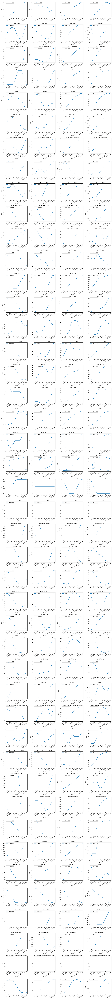

In [15]:
# List the unique products
products = data_combined['product'].unique()

# Set up the figure and axes for the grid, with one row per product and four columns for the years
fig, axes = plt.subplots(nrows=len(products), ncols=4, figsize=(20, 4*len(products)))

# Flatten axes for easier indexing
axes = axes.flatten()

# Loop through each product and plot its price change 
for idx, product in enumerate(products):
    # Filter data for the current product
    product_data = data_combined[data_combined['product'] == product]
    
    # Plot for each year
    for year_idx, year in enumerate([2020, 2021, 2022, 2023]):
        ax = axes[idx * 4 + year_idx]  # Index for subplot
        year_data = product_data[product_data['year'] == year]
        
        # Plot smoothed price change for the current year
        ax.plot(year_data['month'], year_data['smoothed_price'], label=f'Price in {year}')
        ax.set_title(f"{product} ({year})")
        ax.set_xlabel('Month')
        ax.set_ylabel('Price', rotation=90, labelpad=15)  # Rotate y-axis label and add padding
        
        # Rotate the x-axis labels
        ax.tick_params(axis='x', rotation=45)  
        
        ax.legend(loc='upper left')

# Adjust layout for better spacing
plt.tight_layout()

# Optionally save the plot as a PNG file
plt.savefig('price_changes_by_year.png', dpi=300)  # Save with high resolution

plt.show()


In [16]:
year_2020 = pd.DataFrame(data2020['CPI']).rename(columns={'CPI': 2020})
year_2021 = pd.DataFrame(data2021['CPI']).rename(columns={'CPI': 2021})
year_2022 = pd.DataFrame(data2022['CPI']).rename(columns={'CPI': 2022})
year_2023 = pd.DataFrame(data2023['CPI']).rename(columns={'CPI': 2023})

Lets take a look at the correlations between products. The case is of Pearson correlation. It excels in catching linear relationships.

We will further limit the amount of items as the map will get too big to depict if all 45 are included.

In [17]:
# Selected products for correlations

corr_values = [
    "Beef",
    "Poultry",
    "Fresh fish",
    "Fresh whole milk",
    "Yogurt",
    "Cheese",
    "Olive oil",
    "Fresh fruits",
    "Fresh vegetables",
    "Potatoes",
    "Sugar",
    "Coffee",
    "Electricity",
    "Natural gas",
    "Water supply",
    "Heating oil",
    "Solid fuels",
    "Housing",
    "Irons",
    "Pharmaceutical products",
    "Health",
    "Gasoline",
    "Education",
    "Vehicle insurance",
    "Transportation"
]

len(corr_values)

25

What we see in the Pearson correlation map is a consistent deep red color in almost all the boxes. This signifies the synchronous increase of prices in every pair of products.

The interpretation of this such a finding can be falsely expresses sometimes:
    When we calculate the correlation we must keep in mind that we quantify the evolution of two variables, not the causation between them if any.

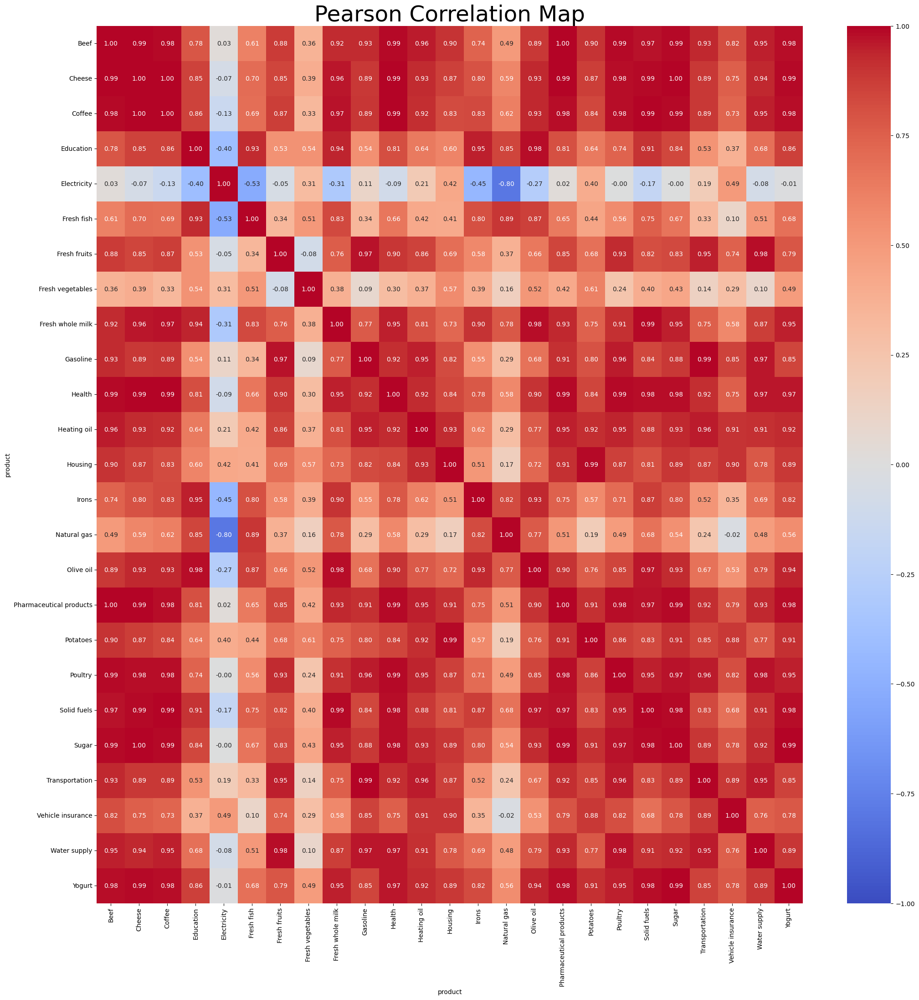

In [18]:
# Step 1: Filter the data based on the selected products
correlation_data = data_combined[data_combined['product'].isin(corr_values)]

# Step 2: Create the pivot table (this must come before calculating correlation)
correlation_data_pivot = correlation_data.pivot_table(index='month', columns='product', values='smoothed_price')

# Step 3: Compute the correlation matrix
correlation_matrix = correlation_data_pivot.corr()

# Step 4: Check if correlation matrix has data
if correlation_matrix.empty:
    print("The correlation matrix is empty. Check the input data or filtering criteria.")
else:
    # Step 5: Plot the heatmap
    plt.figure(figsize=(25, 25))
    sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm', vmin=-1, vmax=1)
    plt.title('Correlation Matrix of Product Prices')

    # Step 6: Save and display the heatmap
    plt.savefig('correlation_heatmap_Pearson.png', dpi=300)  # Save with high resolution

    plt.title('Pearson Correlation Map', fontdict={'fontsize': 35})

    plt.savefig('pearson_correlation.png')

    plt.show()


For non-linear relationships we can use Distance correlation which expresses both linear and non-linear dependencies.
It probably expresses the correlations of prices better than the Pearson correlation as there are instances where progression is not linear (as shown later).

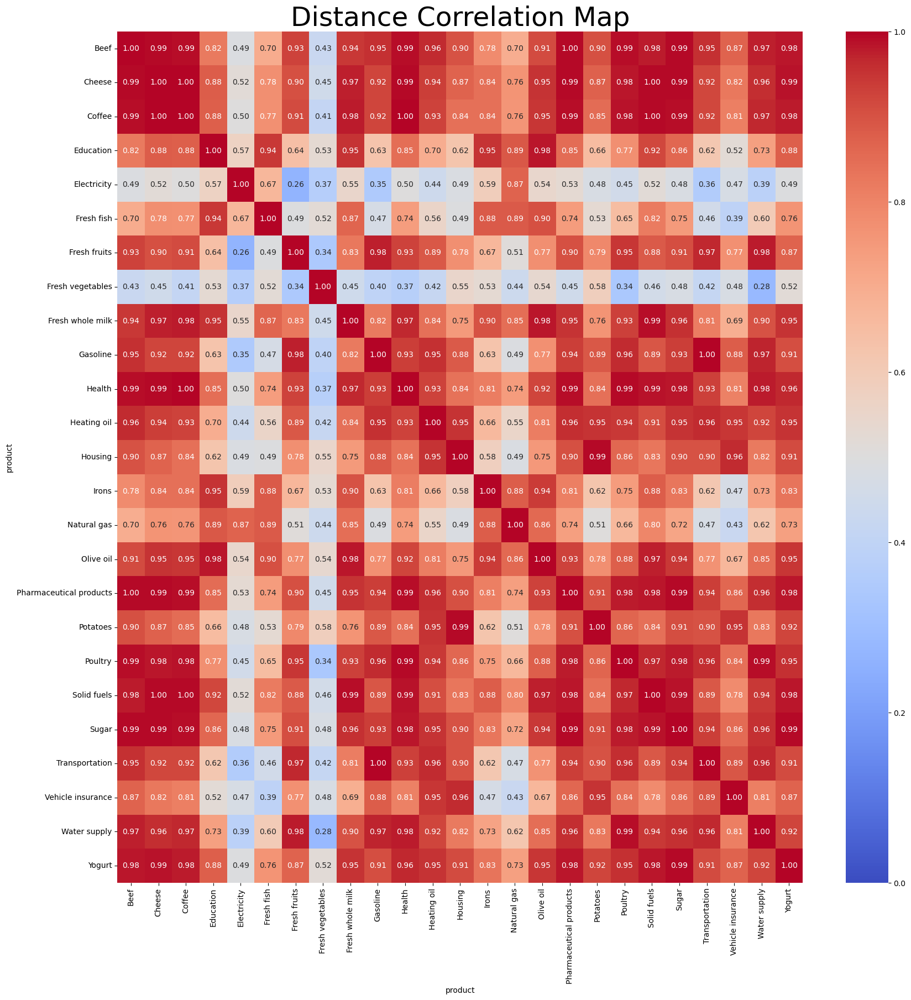

In [19]:
# Pivot the data so each product becomes a column, with prices as values and months as index
pivot_data = correlation_data_pivot

# Initialize an empty DataFrame to store distance correlations
dcor_matrix = pd.DataFrame(np.zeros((len(pivot_data.columns), len(pivot_data.columns))),
                           index=pivot_data.columns, columns=pivot_data.columns)

# Loop through each pair of products and compute distance correlation
for i, product1 in enumerate(pivot_data.columns):
    for j, product2 in enumerate(pivot_data.columns):
        if i <= j:  # Compute only upper triangle and diagonal
            x = pivot_data[product1].fillna(0).values
            y = pivot_data[product2].fillna(0).values

            # Compute the distance correlation
            dcor_value = dcor.distance_correlation(x, y)
            dcor_matrix.iloc[i, j] = dcor_value
            dcor_matrix.iloc[j, i] = dcor_value  # Symmetric matrix

# Plot the heatmap
plt.figure(figsize=(20, 20))  # Adjust size as needed
sns.heatmap(dcor_matrix, annot=True, fmt=".2f", cmap='coolwarm', vmin=0, vmax=1)
plt.title('Distance Correlation Map', fontdict={'fontsize': 35})

plt.savefig('correlation_heatmap_Distance.png', dpi=300)  # Save with high resolution

plt.show()

As mentioned earlier, some correlations are not linear. This implies some sort of intervention made to adjust the prices in the market.

We should also notice the partially linear relationship between the increases of CPI in different products. While some products like, Electricity, wiggle forth and back, some others consistently increase. This directs us to assume that after some point, products that increase and products that increase are uncorrelated.

We also see consistent increase in products that share the same market like Heating oil, Natural gas, Solid fuels and Gasoline (all Petroleum derived products). 

The Granger causality is a statistical method to calculate the likelyness of occurance of a time-series of data that preceeds another time-series data.
It is not a measure of cause-effect relationship rather than a measure of forecasting the behaviour of a time-series when another time-series takes place before the prior.

When p-value is lower than 0.05 we can expect that some sort of causality is expected between 2 incidents, meaning that purly luck correlated occurance is highly unlikely (Null Hypothesis).

When p-value is less than 0.05 we reject the Null Hypothesis.

In [20]:
correlation_data = data_combined[data_combined['product'].isin(corr_values)]

# Pivot the data so that each product becomes a column
pivot_data = correlation_data.pivot_table(index='month', columns='product', values='smoothed_price')

# List of products after pivoting
products = pivot_data.columns

granger_results_list = []

# Loop through each pair of products
for i, product1 in enumerate(products):
    for j, product2 in enumerate(products):
        if i < j:  # Ensure each pair is unique (product1 != product2)
            # Get the product data
            series1 = pivot_data[product1].fillna(0)
            series2 = pivot_data[product2].fillna(0)
            
            # Perform Granger Causality Test for max 3 lags
            gc_result = grangercausalitytests(pd.concat([series1, series2], axis=1), maxlag=3, verbose=False)
            
            # Extract p-values for each lag
            for lag, result in gc_result.items():
                p_value = result[0]['ssr_chi2test'][1]
                # Collect the result in the list
                granger_results_list.append({
                    'Product1': product1,
                    'Product2': product2,
                    'Lag': lag,
                    'P-Value': p_value
                })

# Convert the list to a DataFrame
granger_results = pd.DataFrame(granger_results_list)

/home/admin1997/miniconda3/envs/tensorflow/lib/python3.12/site-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(


In [21]:
# Filter p-calues > 0.05
significant_results = granger_results[granger_results['P-Value'] < 0.05]
print(significant_results)


              Product1           Product2  Lag   P-Value
17                Beef       Fresh fruits    3  0.042333
19                Beef   Fresh vegetables    2  0.010887
20                Beef   Fresh vegetables    3  0.041441
26                Beef           Gasoline    3  0.017385
32                Beef        Heating oil    3  0.000016
..                 ...                ...  ...       ...
883     Transportation  Vehicle insurance    2  0.009746
887     Transportation       Water supply    3  0.004170
892  Vehicle insurance       Water supply    2  0.024170
893  Vehicle insurance       Water supply    3  0.003291
899       Water supply             Yogurt    3  0.035201

[289 rows x 4 columns]


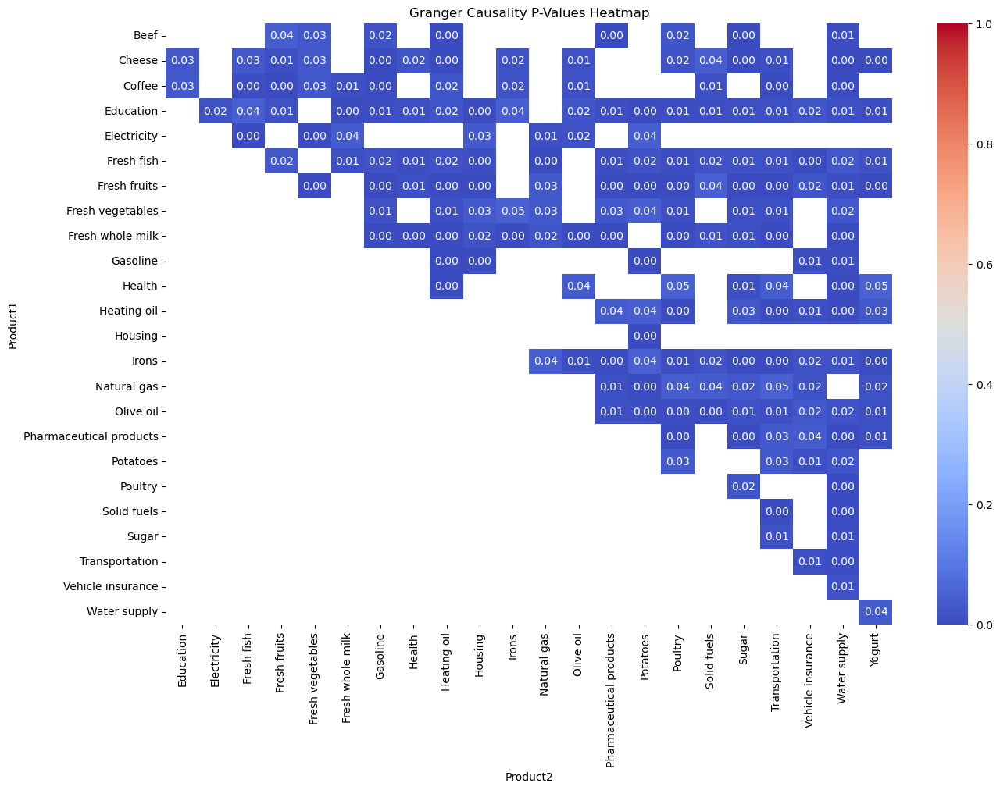

In [22]:
# Pivot the Granger results DataFrame to make it easier to visualize
granger_pivot = significant_results.pivot_table(index='Product1', columns='Product2', values='P-Value')

plt.figure(figsize=(15, 10))
sns.heatmap(granger_pivot, annot=True, cmap='coolwarm', fmt='.2f', vmin=0, vmax=1)
plt.title('Granger Causality P-Values Heatmap')

plt.savefig('Granger_causality_map.png', dpi=300)  # Save with high resolution

plt.show()



Partial correlation is a measure of the correlation between two variables when we remove the influence of every other variable from the two variables of interest. It is a good measure of correlation between variables that are not associated via any other variable in the data set. 

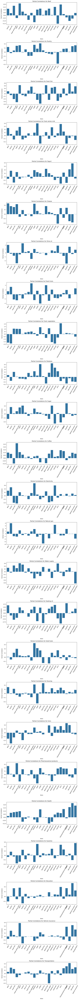

In [23]:
correlation_data_pivot = correlation_data.pivot_table(index='month', columns='product', values='smoothed_price')

corr_values = [
    "Beef",
    "Poultry",
    "Fresh fish",
    "Fresh whole milk",
    "Yogurt",
    "Cheese",
    "Olive oil",
    "Fresh fruits",
    "Fresh vegetables",
    "Potatoes",
    "Sugar",
    "Coffee",
    "Electricity",
    "Natural gas",
    "Water supply",
    "Heating oil",
    "Solid fuels",
    "Housing",
    "Irons",
    "Pharmaceutical products",
    "Health",
    "Gasoline",
    "Education",
    "Vehicle insurance",
    "Transportation"
]


# Filter correlation data to only include the selected products
correlation_data_filtered = correlation_data_pivot[corr_values]

# Create a figure with multiple subplots
fig, axes = plt.subplots(len(corr_values), 1, figsize=(10, 5 * len(corr_values)))

# If there is only one subplot, `axes` will not be a list, so we ensure it's treated as a list
if len(corr_values) == 1:
    axes = [axes]

# Loop through each product
for i, product in enumerate(corr_values):
    # Set independent variables (other products) and dependent variable (current product)
    X = correlation_data_filtered.drop(columns=[product])  # All products except the current one
    y = correlation_data_filtered[product]  # Current product as dependent variable
    
    # Add constant to independent variables
    X = sm.add_constant(X)
    
    # Calculate OLS model
    model = sm.OLS(y, X).fit()
    
    # Get the coefficients for each product (partial correlation-like interpretation)
    partial_corr = model.params[1:]  # Exclude the constant term
    
    # Plot Partial Correlation (coefficients as barplot)
    sns.barplot(x=partial_corr.index, y=partial_corr.values, ax=axes[i])
    
    # Set plot title and labels
    axes[i].set_title(f"Partial Correlations for {product}")
    axes[i].set_ylabel("Partial Correlation")
    
    # Tilt the x-axis labels by 60 degrees
    axes[i].tick_params(axis='x', rotation=60)

plt.tight_layout()  # Adjust spacing to prevent overlap

plt.savefig('Partial_Correlation_bars.png', dpi=300)  # Save with high resolution

plt.show()

The following graphs depict the Dynamic Time Warping Distance. It is a measure of the progression of one time series relevant to the another if they are timely seperated.
A small DTW distance points to a similar trend when time progresses. This is particularly useful when forecasting the behaviour of a trend.

Scaling is also very useful when using DTW. By scaling we can filter out non important graphs easily as 0.1 values or lower signify high trend relation.

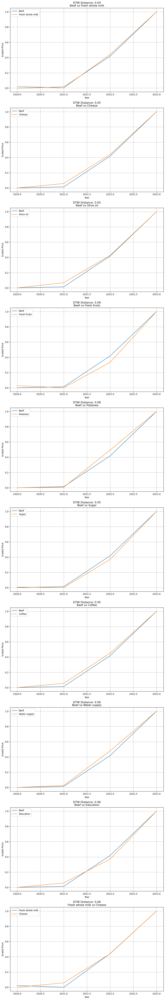

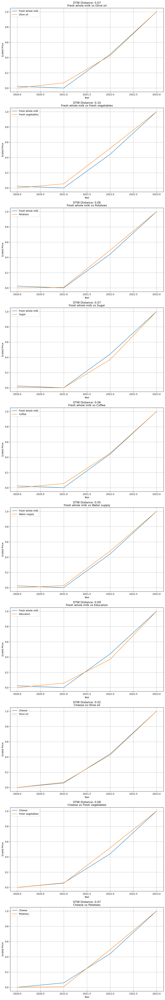

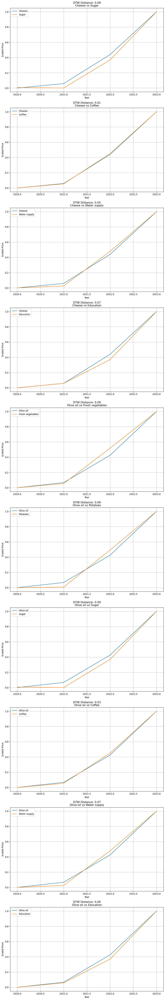

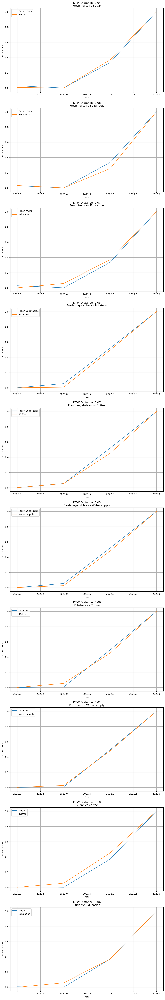

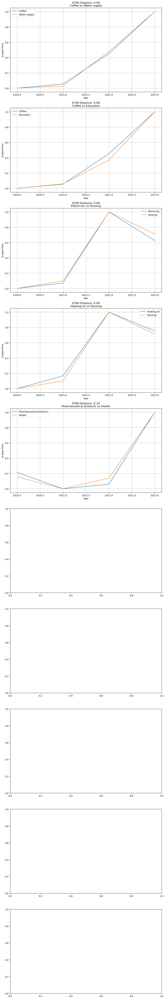

In [24]:
products_to_analyze = [
    "Beef",
    "Poultry",
    "Fresh fish",
    "Fresh whole milk",
    "Yogurt",
    "Cheese",
    "Olive oil",
    "Fresh fruits",
    "Fresh vegetables",
    "Potatoes",
    "Sugar",
    "Coffee",
    "Electricity",
    "Natural gas",
    "Water supply",
    "Heating oil",
    "Solid fuels",
    "Housing",
    "Irons",
    "Pharmaceutical products",
    "Health",
    "Gasoline",
    "Education",
    "Vehicle insurance",
    "Transportation"
]

# Filter correlation data for the selected products
correlation_data = data_combined[
    data_combined['product'].isin(products_to_analyze)
].pivot_table(index='year', columns='product', values='smoothed_price')

# Apply MinMaxScaler and retain column names
scaler = MinMaxScaler(feature_range=(0, 1))
scaled_data = pd.DataFrame(
    scaler.fit_transform(correlation_data), 
    index=correlation_data.index, 
    columns=correlation_data.columns
)

# Generate all unique pairs of products
product_pairs = list(itertools.combinations(products_to_analyze, 2))

# Threshold for plotting
dtw_threshold = 0.1  # Only plot pairs with DTW distance below this value

# Initialize figure tracking
plots_per_figure = 10  # Maximum number of plots per figure
plot_count = 0
fig, axes = plt.subplots(plots_per_figure, 1, figsize=(10, 6 * plots_per_figure))
axes = axes.flatten()  # Flatten for easier indexing

# Track subplot index
current_ax_index = 0

# List to keep the pairs with small DTW
list_of_pairs =[]
for product1, product2 in product_pairs:
    if product1 in scaled_data.columns and product2 in scaled_data.columns:
        # Extract the time series
        series1 = scaled_data[product1].fillna(0).values
        series2 = scaled_data[product2].fillna(0).values
        
        # Compute DTW distance
        distance = dtw(series1, series2)
        
        # Plot only if the distance is below the threshold
        if distance <= dtw_threshold:
            list_of_pairs.append((product1, product2))
            if current_ax_index >= plots_per_figure:  # Save and create a new figure if full
                plt.tight_layout()
                plt.savefig(f'Partial_Correlation_map_{plot_count + 1}.png', dpi=300)
                plt.show()
                plot_count += 1
                current_ax_index = 0
                fig, axes = plt.subplots(plots_per_figure, 1, figsize=(10, 6 * plots_per_figure))
                axes = axes.flatten()

            ax = axes[current_ax_index]
            ax.plot(scaled_data.index, series1, label=product1)
            ax.plot(scaled_data.index, series2, label=product2)
            ax.set_title(f'DTW Distance: {distance:.2f}\n{product1} vs {product2}')
            ax.set_xlabel('Year')
            ax.set_ylabel('Scaled Price')
            ax.legend()
            ax.grid()
            current_ax_index += 1

# Save any remaining plots in the last figure
if current_ax_index > 0:
    plt.tight_layout()
    plt.savefig(f'DTW_{plot_count + 1}.png', dpi=300)
    plt.show()


In [25]:
dtw_df = pd.DataFrame(list_of_pairs, columns=['product1', 'product2'])
dtw_df

,product1,product2
0,Beef,Fresh whole milk
1,Beef,Cheese
2,Beef,Olive oil
3,Beef,Fresh fruits
4,Beef,Potatoes
5,Beef,Sugar
6,Beef,Coffee
7,Beef,Water supply
8,Beef,Education
9,Fresh whole milk,Cheese


In [26]:
dtw_df.to_csv('dtw.csv', index=False)

With the pairs of small DTW (hence higly correlated) products, the correlation heatmaps and the lineplots we can have some good indicators that increases to the CPI of certain products is correlated to the increase of CPI in other products.

- Increases in animal products follow similar trends as other consumer products (most edibles)
- Changes in Electricity and Heating Oil follow similar patterns 